# Learn to use Stable Diffusion
There are many version of SD, lets try and learn about them.

In [24]:
from diffusers import DiffusionPipeline, StableDiffusionPipeline, StableDiffusionXLPipeline, StableDiffusion3Pipeline, DDPMPipeline
import torch

In [11]:
#%pip install --upgrade transformers

In [12]:
# %pip install --upgrade diffusers[torch]

In [13]:
# Models:
#realisticVisionV60B1_v51HyperVAE.safetensors

# Stable Diffusion 1.5

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]c:\ProgramData\Anaconda3\envs\tf38\lib\site-packages\transformers\models\clip\feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
Some weights of the model checkpoint were not used when initializing CLIPTextModel: 
 ['text_model.embeddings.position_ids']
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 15.92it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumsta

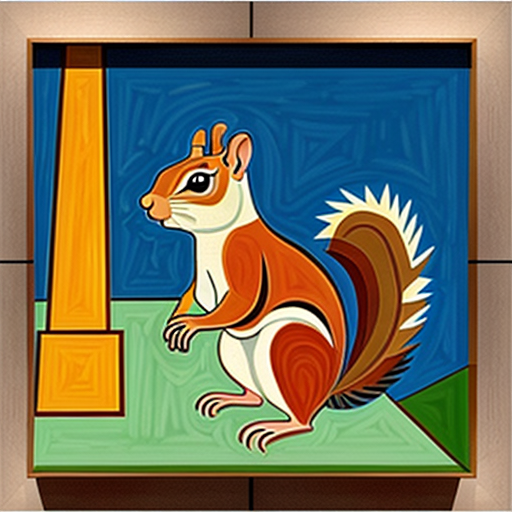

In [14]:
#pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
pipeline = StableDiffusionPipeline.from_single_file("../diffusers/realisticVisionV60B1_v51HyperVAE.safetensors", torch_dtype=torch.float16)
pipeline.to("cuda")
pipeline("An image of a squirrel in Picasso style").images[0]

100%|██████████| 50/50 [00:04<00:00, 12.42it/s]


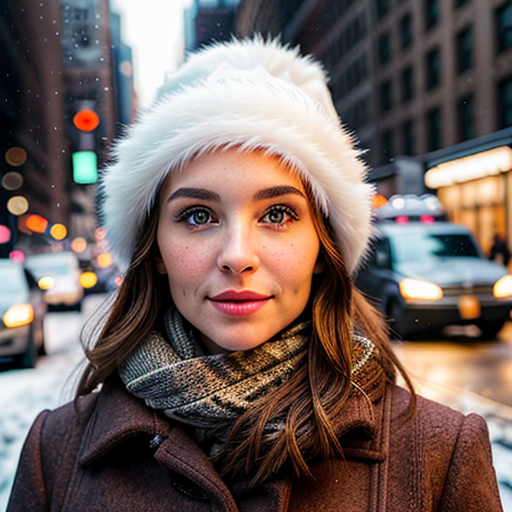

In [15]:
pipeline("A portrait of a beautiful woman dressed for winter, looking into the camera, standing on the streets of New York. Photorealistic face, portrait").images[0]

# Test other scheduler

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]Some weights of the model checkpoint were not used when initializing CLIPTextModel: 
 ['text_model.embeddings.position_ids']
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  9.97it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
100%|██████████| 50/50 [00:03<00:00, 14.00it/s]


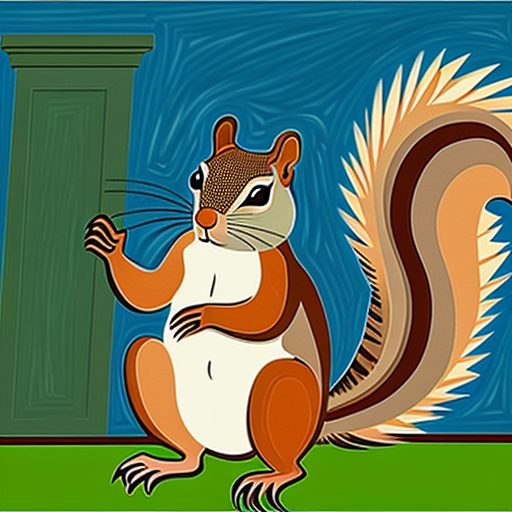

In [34]:
from diffusers import EulerDiscreteScheduler
pipeline = StableDiffusionPipeline.from_single_file("../diffusers/realisticVisionV60B1_v51HyperVAE.safetensors", torch_dtype=torch.float16)
pipeline.scheduler = EulerDiscreteScheduler.from_config(pipeline.scheduler.config)
pipeline.to("cuda")
pipeline("An image of a squirrel in Picasso style").images[0]

# Huggingface SD 1.5 raw model

In [38]:
model_id = "runwayml/stable-diffusion-v1-5"
pipeline = DiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, use_safetensors=True)


Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  3.56it/s]


In [39]:
generator = torch.Generator("cuda").manual_seed(0)
pipeline = pipeline.to("cuda")
prompt = "portrait photo of a old warrior chief"
image = pipeline(prompt, generator=generator).images[0]

100%|██████████| 50/50 [00:03<00:00, 13.23it/s]


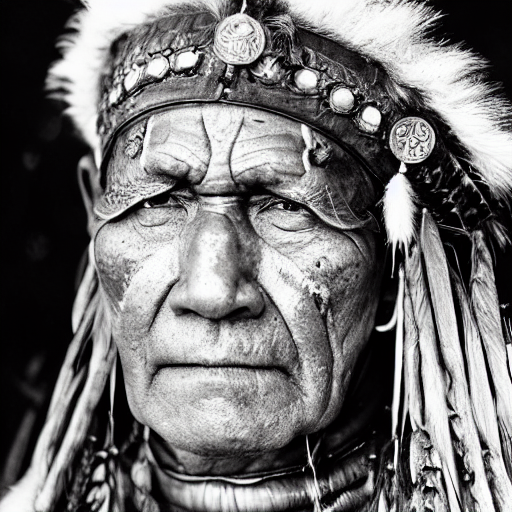

In [40]:
image

In [41]:
# Check scheduler comatibility
pipeline.scheduler.compatibles

[diffusers.schedulers.scheduling_k_dpm_2_discrete.KDPM2DiscreteScheduler,
 diffusers.schedulers.scheduling_unipc_multistep.UniPCMultistepScheduler,
 diffusers.schedulers.scheduling_pndm.PNDMScheduler,
 diffusers.schedulers.scheduling_deis_multistep.DEISMultistepScheduler,
 diffusers.utils.dummy_torch_and_torchsde_objects.DPMSolverSDEScheduler,
 diffusers.schedulers.scheduling_heun_discrete.HeunDiscreteScheduler,
 diffusers.schedulers.scheduling_euler_ancestral_discrete.EulerAncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_euler_discrete.EulerDiscreteScheduler,
 diffusers.schedulers.scheduling_ddim.DDIMScheduler,
 diffusers.schedulers.scheduling_k_dpm_2_ancestral_discrete.KDPM2AncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_dpmsolver_singlestep.DPMSolverSinglestepScheduler,
 diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler,
 diffusers.schedulers.scheduling_edm_euler.EDMEulerScheduler,
 diffusers.schedulers.scheduling_ddpm.DDPMSched

In [43]:
[prompt]*5

['portrait photo of a old warrior chief',
 'portrait photo of a old warrior chief',
 'portrait photo of a old warrior chief',
 'portrait photo of a old warrior chief',
 'portrait photo of a old warrior chief']

In [50]:
pipeline.enable_attention_slicing() 

In [51]:
images = pipeline(prompt=[prompt]*5, generator=generator).images

100%|██████████| 50/50 [00:54<00:00,  1.10s/it]


In [46]:
images

[<PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>]

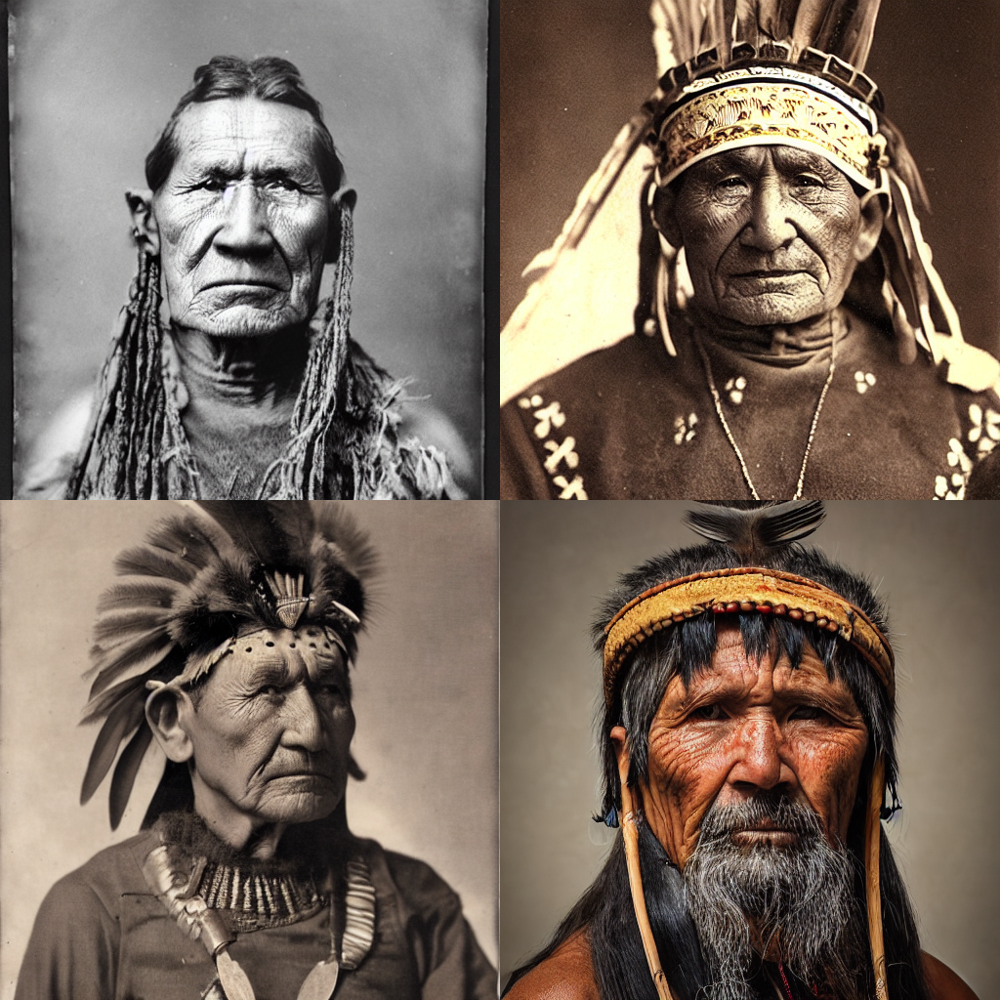

In [52]:
from diffusers.utils import make_image_grid
make_image_grid(images[:4], rows=2, cols=2)

# Stable Diffusion XL
Lets try and load a SDXL checkpoint and play with that

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]Some weights of the model checkpoint were not used when initializing CLIPTextModel: 
 ['text_model.embeddings.position_ids']
100%|██████████| 50/50 [00:22<00:00,  2.25it/s]


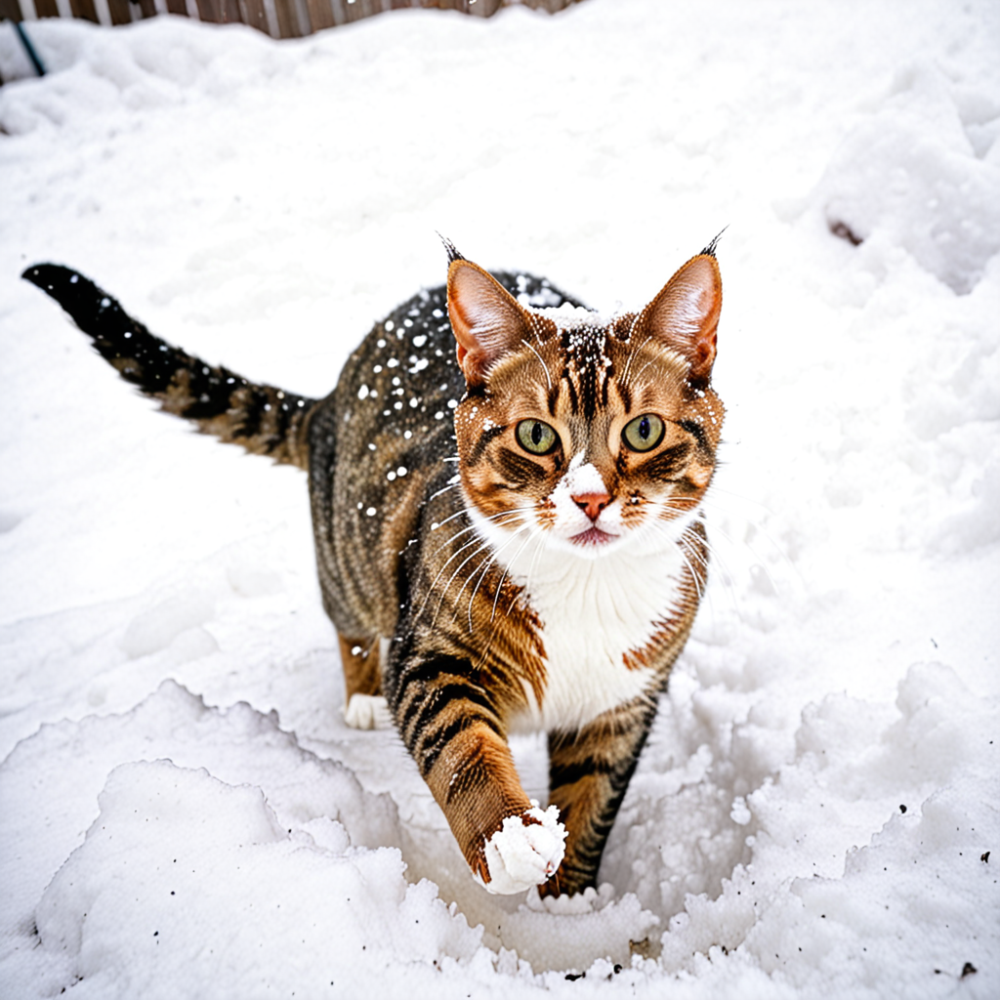

In [16]:
pipeline = StableDiffusionXLPipeline.from_single_file("../diffusers/Juggernaut_X_RunDiffusion_Hyper.safetensors", torch_dtype=torch.float16)
pipeline.to("cuda")
pipeline("A photo of a cat playing in the snow").images[0]

100%|██████████| 50/50 [04:38<00:00,  5.57s/it]


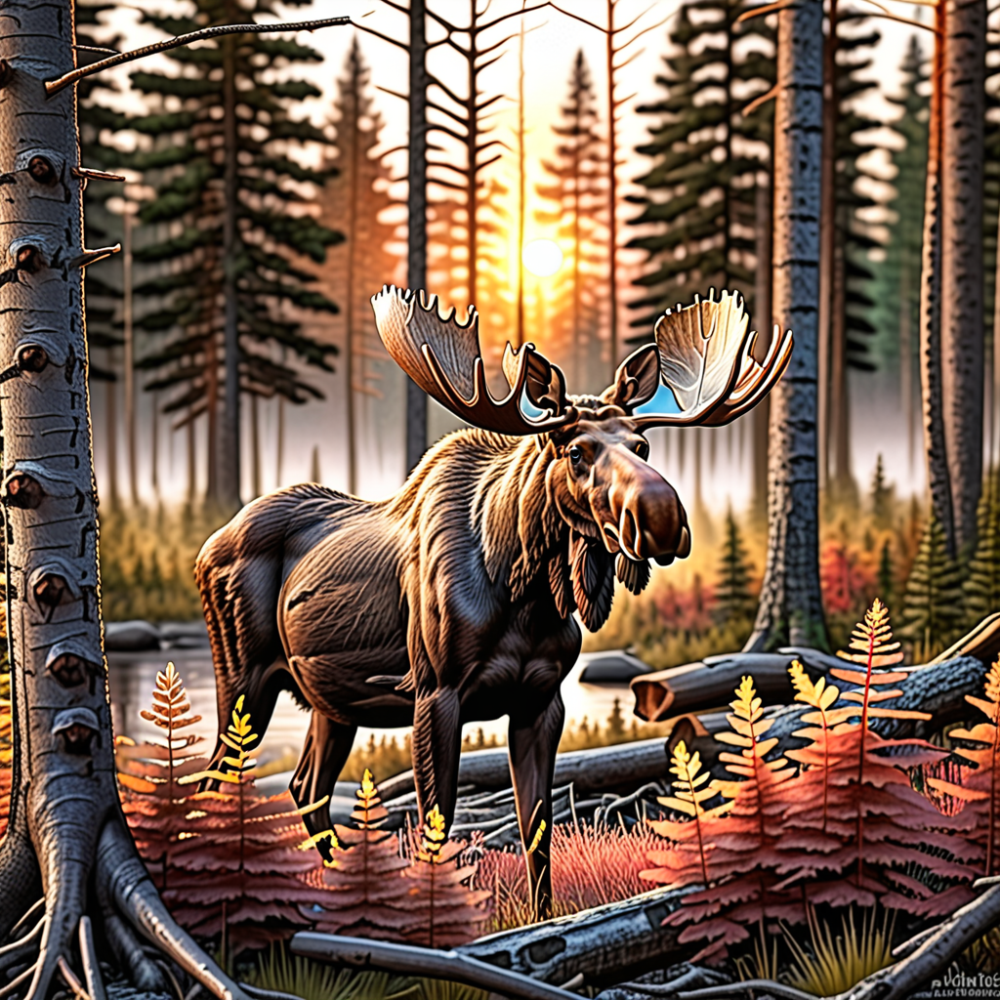

In [17]:
pipeline(prompt='A moose in the woods during sunrise, photo realistic',num_inference_steps=50, guidance_scale=7.5).images[0]

In [18]:
# Generate a batch of 10 images using the same prompt
num_images = 2
prompt = "a photorealistic portrait of a futuristic city at night with neon lights"

# Generate the images
images = pipeline(prompt, num_inference_steps=30, guidance_scale=7.5, num_images_per_prompt=num_images).images




100%|██████████| 30/30 [01:13<00:00,  2.46s/it]


Image 1:
Image 2:


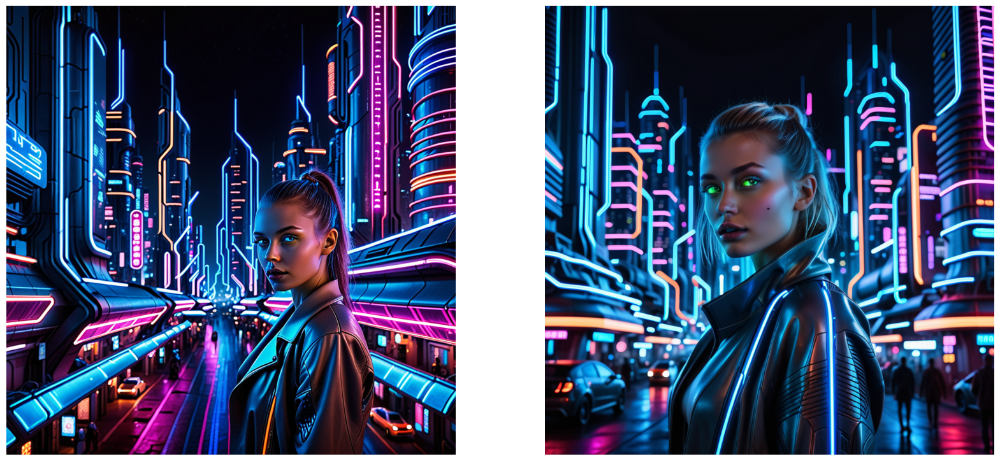

In [21]:
# Display the batch of images using matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 10))
for i, image in enumerate(images):
    plt.subplot(1, num_images, i + 1)
    plt.imshow(image)
    plt.axis("off")

# Stable Diffusion 3

# Must Log in to Huggingface
huggingface-cli login

In [28]:
from huggingface_hub import login, whoami
huggingface_token = "INPUT TOKEN HERE"
login(token=huggingface_token)

user_info = whoami()
print(f"Logged in as: {user_info['name']}")

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: write).
Your token has been saved to C:\Users\cerion\.cache\huggingface\token
Login successful
Logged in as: cerion42


100%|██████████| 28/28 [00:15<00:00,  1.79it/s]


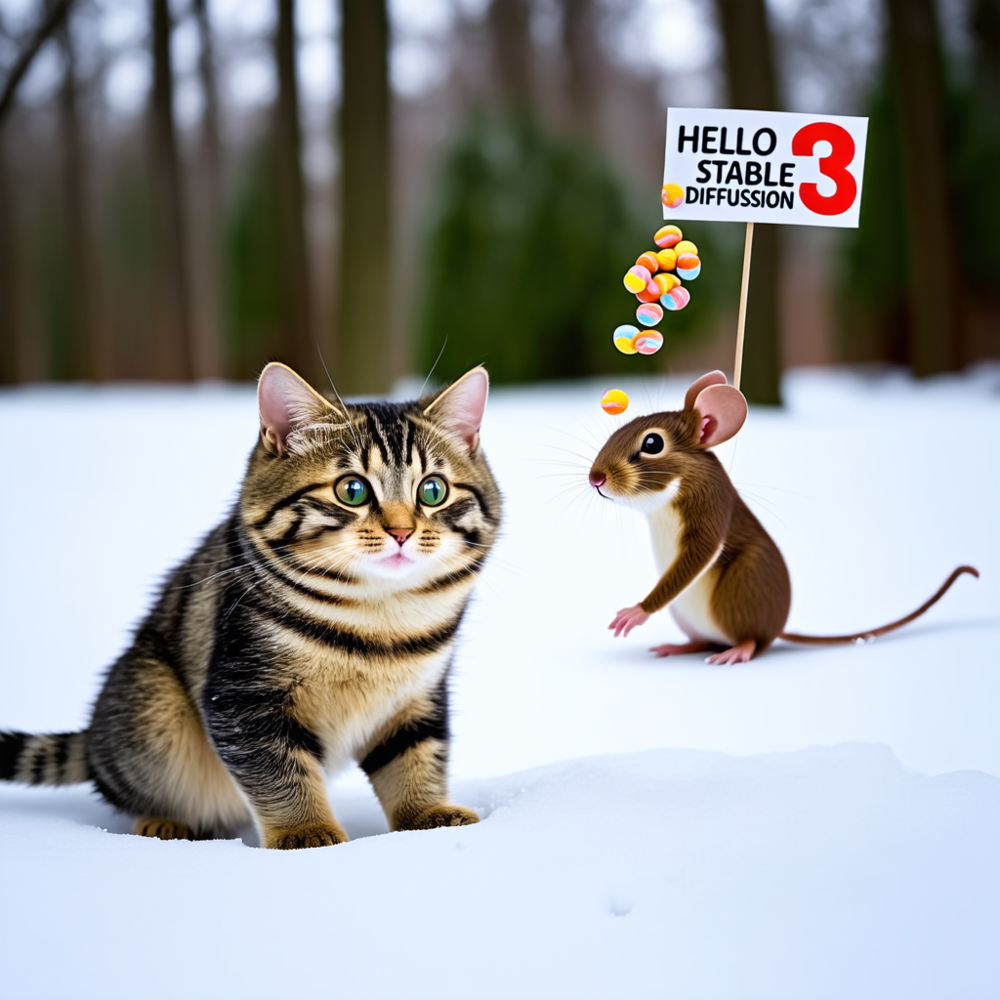

In [32]:
pipeline = StableDiffusion3Pipeline.from_single_file("../diffusers/stableDiffusion3SD3_sd3MediumInclClips.safetensors",
                                                      torch_dtype=torch.float16,
                                                      text_encoder_3=None
                                                      )
pipeline.enable_model_cpu_offload()
#pipeline.to("cuda")
pipeline("A photo of a cat playing in the snow and tossing candy into the air. A mouse standing in the background holds a small sign where it says 'Hello Stable Diffusion 3'").images[0]

# Test of googles 'old' celeb diffusion DDPM algorithm

In [19]:
image_pipe = DDPMPipeline.from_pretrained("google/ddpm-celebahq-256")
image_pipe.to("cuda")

diffusion_pytorch_model.safetensors not found
Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]An error occurred while trying to fetch C:\Users\cerion\.cache\huggingface\hub\models--google--ddpm-celebahq-256\snapshots\cd5c944777ea2668051904ead6cc120739b86c4d: Error no file named diffusion_pytorch_model.safetensors found in directory C:\Users\cerion\.cache\huggingface\hub\models--google--ddpm-celebahq-256\snapshots\cd5c944777ea2668051904ead6cc120739b86c4d.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...: 100%|██████████| 2/2 [00:00<00:00,  3.71it/s]


DDPMPipeline {
  "_class_name": "DDPMPipeline",
  "_diffusers_version": "0.30.3",
  "_name_or_path": "google/ddpm-celebahq-256",
  "scheduler": [
    "diffusers",
    "DDPMScheduler"
  ],
  "unet": [
    "diffusers",
    "UNet2DModel"
  ]
}

In [22]:
images = image_pipe().images

100%|██████████| 1000/1000 [03:18<00:00,  5.05it/s]


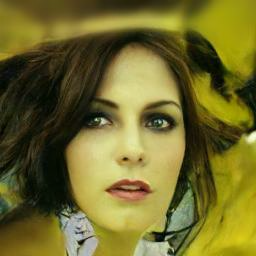

In [23]:
images[0]